## Decision Tree Regressor Air Quality Index Prediction

### Apply ML algorithms

- Linear Regression
- Lasso Regression
- Decision Tree Regressor
- KNN Regressor
- RandomForestRegressor
- Xgboost Regressor
- Huperparameter Tuning
- ANN- Artificial Neural Network

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Real_Combine.csv')
df.rename(columns={'T': 'Average_Temprature',
                   'TM': 'Temprature_Maximum',
                   'Tm': 'Temprature_Minimum',
                   'H': 'Average_Humidity',
                   'VV': 'Average_Visibility',
                   'V': 'Average_Wind_Speed',
                   'VM': 'Maximum_Wind_Speed',
                   'PM 2.5': 'PM_2.5_AQI'
                  },inplace = True)
df.head()

,Average_Temprature,Temprature_Maximum,Temprature_Minimum,Average_Humidity,Average_Visibility,Average_Wind_Speed,Maximum_Wind_Speed,PM_2.5_AQI
0,23.4,30.3,19.0,59.0,6.3,4.3,5.4,284.795833
1,22.4,30.3,16.9,57.0,6.9,3.3,7.6,219.720833
2,24.0,31.8,16.9,51.0,6.9,2.8,5.4,182.187500
3,22.8,30.2,17.6,55.0,7.7,3.7,7.6,154.037500
4,23.1,30.6,17.4,46.0,6.9,3.3,5.4,223.208333


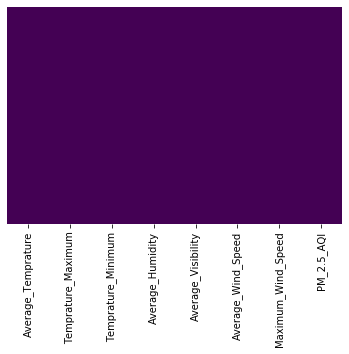

In [3]:
## Check for null values
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [4]:
df=df.dropna()

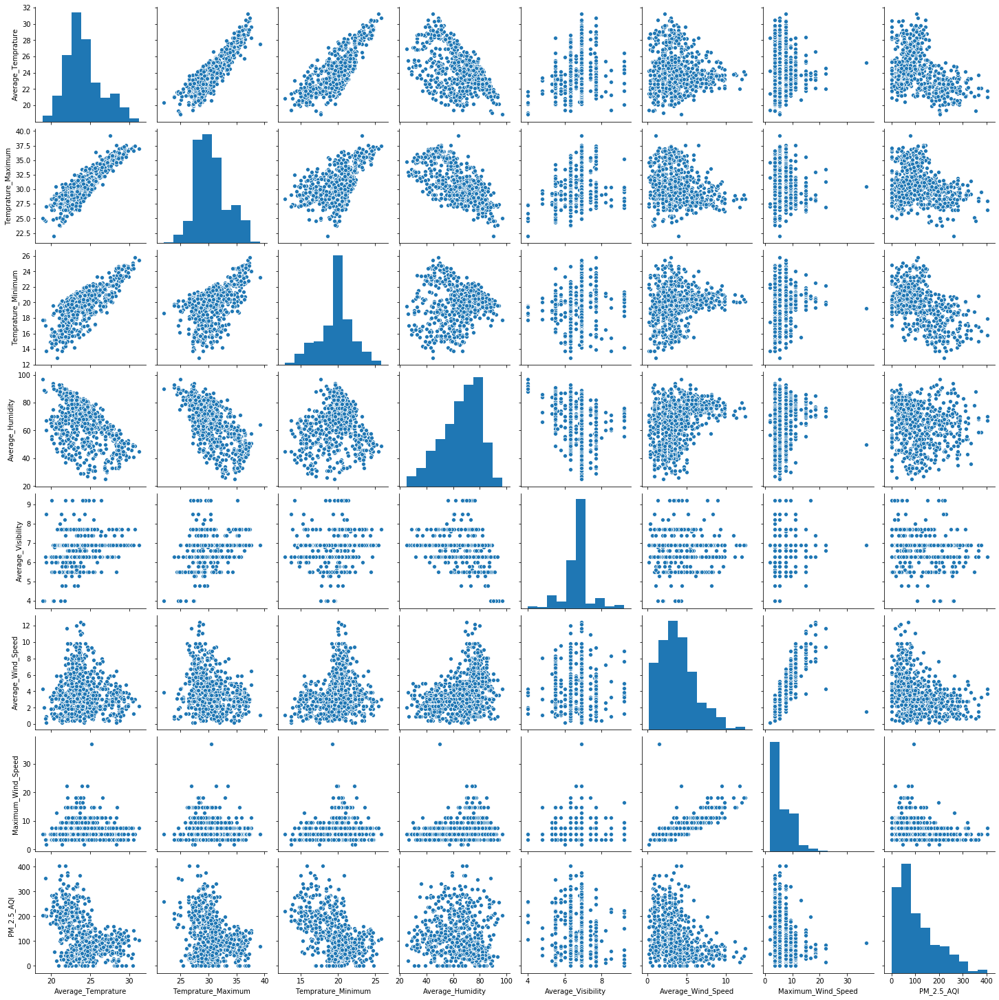

In [5]:
sns.pairplot(df)

In [6]:
df.corr()

,Average_Temprature,Temprature_Maximum,Temprature_Minimum,Average_Humidity,Average_Visibility,Average_Wind_Speed,Maximum_Wind_Speed,PM_2.5_AQI
Average_Temprature,1.000000,0.882433,0.772471,-0.479727,0.298138,-0.060587,-0.022747,-0.370754
Temprature_Maximum,0.882433,1.000000,0.512705,-0.659010,0.275448,-0.233228,-0.160021,-0.194339
Temprature_Minimum,0.772471,0.512705,1.000000,0.101630,0.102964,0.217269,0.196513,-0.519450
Average_Humidity,-0.479727,-0.659010,0.101630,1.000000,-0.282130,0.380803,0.299179,-0.189129
Average_Visibility,0.298138,0.275448,0.102964,-0.282130,1.000000,0.020445,0.007957,-0.138311
Average_Wind_Speed,-0.060587,-0.233228,0.217269,0.380803,0.020445,1.000000,0.792492,-0.402463
Maximum_Wind_Speed,-0.022747,-0.160021,0.196513,0.299179,0.007957,0.792492,1.000000,-0.339834
PM_2.5_AQI,-0.370754,-0.194339,-0.519450,-0.189129,-0.138311,-0.402463,-0.339834,1.000000


### Correlation Matrix with Heatmap
Correlation states how the features are related to each other or the target variable.
Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)
Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

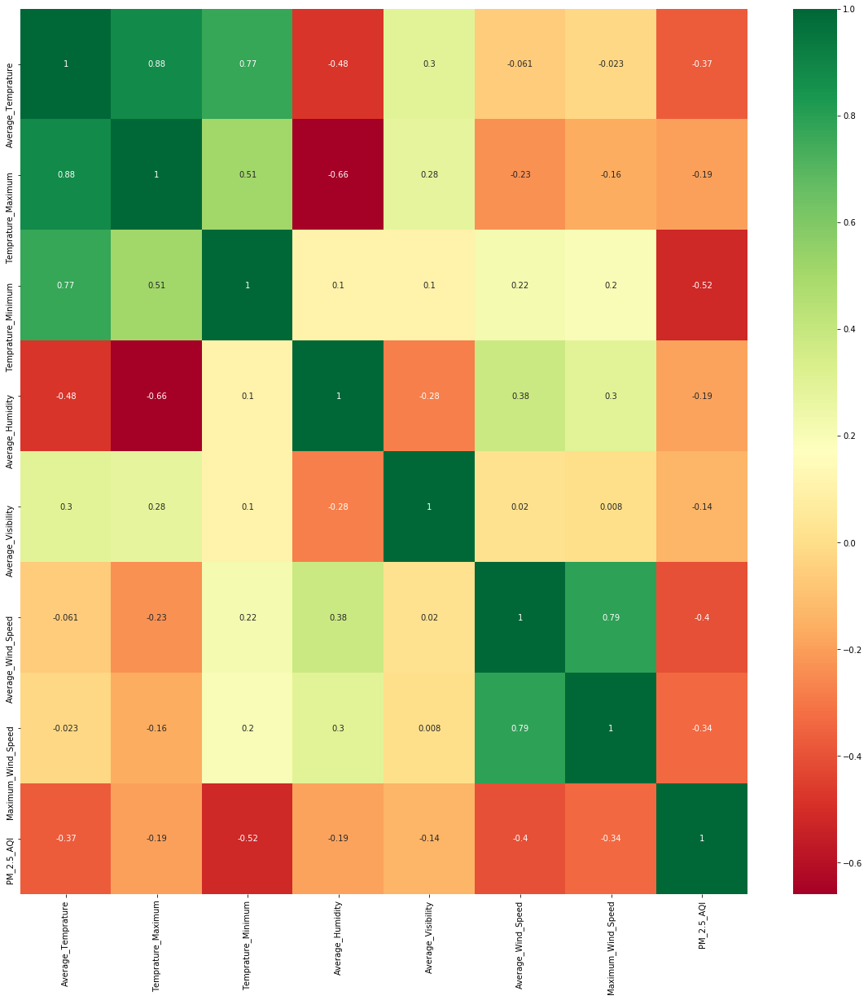

In [7]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [8]:
corrmat.index

Index(['Average_Temprature', 'Temprature_Maximum', 'Temprature_Minimum',
       'Average_Humidity', 'Average_Visibility', 'Average_Wind_Speed',
       'Maximum_Wind_Speed', 'PM_2.5_AQI'],
      dtype='object')

In [9]:
# df=df.drop(['Average_Temprature','Average_Wind_Speed'],axis = 1)
# df.corr()

In [10]:
X=df.iloc[:,:-1] ## independent features
y=df.iloc[:,-1] ## dependent features

### Feature Importance
You can get the feature importance of each feature of your dataset by using the feature importance property of the model.
Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.
Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.

In [11]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False)

In [12]:
X.head()

,Average_Temprature,Temprature_Maximum,Temprature_Minimum,Average_Humidity,Average_Visibility,Average_Wind_Speed,Maximum_Wind_Speed
0,23.4,30.3,19.0,59.0,6.3,4.3,5.4
1,22.4,30.3,16.9,57.0,6.9,3.3,7.6
2,24.0,31.8,16.9,51.0,6.9,2.8,5.4
3,22.8,30.2,17.6,55.0,7.7,3.7,7.6
4,23.1,30.6,17.4,46.0,6.9,3.3,5.4


In [13]:
print(model.feature_importances_)

[0.19564276 0.11890427 0.27143765 0.10988486 0.07241165 0.14803228
 0.08368654]


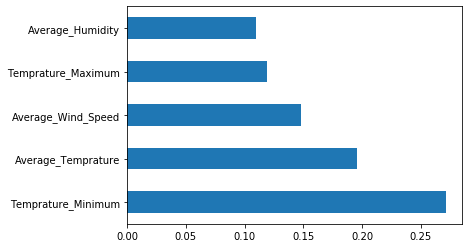

In [14]:

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

### Decision Tree Regressor

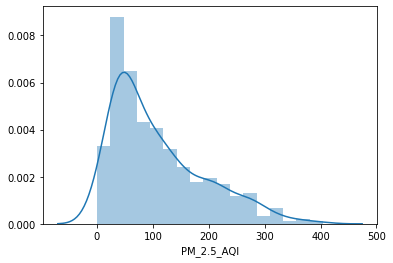

In [15]:
sns.distplot(y)

### Train Test split

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [17]:
from sklearn.tree import DecisionTreeRegressor

In [18]:
dtree=DecisionTreeRegressor(criterion="mse")

In [19]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [20]:
print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [21]:
print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on test set: 0.036781717437664896


In [22]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)

In [23]:
score.mean()

-0.24083140654607846

## Tree Visualization

Scikit learn actually has some built-in visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library, but here is an example of what it looks like and the code to execute this:

In [24]:
##conda install pydotplus
## conda install python-graphviz
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus

In [25]:
features = list(df.columns[:-1])
features

['Average_Temprature',
 'Temprature_Maximum',
 'Temprature_Minimum',
 'Average_Humidity',
 'Average_Visibility',
 'Average_Wind_Speed',
 'Maximum_Wind_Speed']

In [26]:
import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [27]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Model Evaluation

In [28]:
prediction=dtree.predict(X_test)

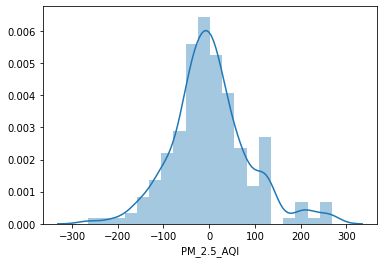

In [29]:
sns.distplot(y_test-prediction)

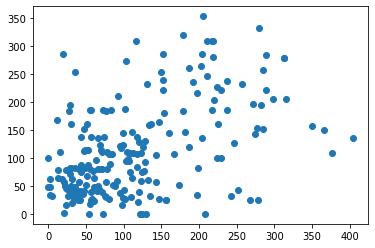

In [30]:
plt.scatter(y_test,prediction)

### Hyperparameter Tuning DEcision Tree Regressor

In [31]:
DecisionTreeRegressor()

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [32]:

## Hyper Parameter Optimization

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}

In [33]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [34]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [35]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [36]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 1228 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 3788 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 7372 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done 11980 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 17612 tasks      | elapsed:   46.5s
[Parallel(n_jobs=-1)]: Done 24268 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 34060 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 51468 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 70924 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 92428 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  3.5min finished



 Time taken: 0 hours 3 minutes and 28.72 seconds.


In [37]:
random_search.best_params_

{'max_depth': 6,
 'max_features': 'log2',
 'max_leaf_nodes': None,
 'min_samples_leaf': 3,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [38]:
random_search.best_score_

-4305.352225660813

In [39]:
predictions=random_search.predict(X_test)

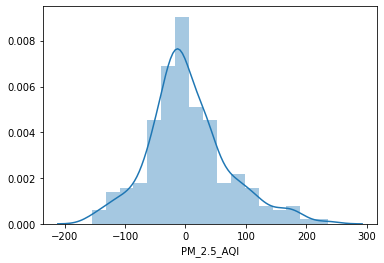

In [40]:
sns.distplot(y_test-predictions)

# Regression Evaluation Metrics


Here are three common evaluation metrics for regression problems:

**Mean Absolute Error** (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

**Mean Squared Error** (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

**Root Mean Squared Error** (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

- **MAE** is the easiest to understand, because it's the average error.
- **MSE** is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
- **RMSE** is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are **loss functions**, because we want to minimize them.

In [44]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 62.07062594268477
MSE: 7189.484055744092
RMSE: 84.79082530406278


In [45]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 49.47736549122625
MSE: 4456.712141353023
RMSE: 66.75861099029116


In [43]:
import pickle 
# open a file, where you ant to store the data
file = open('decision_regression_model.pkl', 'wb')
# dump information to that file
pickle.dump(random_search, file)